In [13]:
# --- Cell 1: neighbor graph (once) ---
import numpy as np, h5py
from pathlib import Path

H5 = Path("exports/Loudspeaker_20mm.h5")
G  = "/Proc-2_3D_Cuboid,20_mm_resolution"

# Load positions if not in memory
if 'pos' not in globals():
    with h5py.File(H5,"r") as f:
        pos = np.array(f[f"{G}/POSITION"])   # (N,3)

# Build 12-NN (1 self + 11 neighbors); fall back to brute force if sklearn missing
try:
    from sklearn.neighbors import NearestNeighbors
    knn = NearestNeighbors(n_neighbors=12, algorithm="auto").fit(pos)
    nbr_idx = knn.kneighbors(return_distance=False)  # (N,12)
except Exception:
    def _nbrs(X, k):
        D2 = (X*X).sum(1)[:,None] + (X*X).sum(1)[None,:] - 2*X@X.T
        D2[D2<0]=0
        return np.argsort(D2, axis=1)[:,:k]
    nbr_idx = _nbrs(pos, 12)

nbr_idx_ = nbr_idx[:,1:]  # drop self


In [ ]:
# ===== Cell 2: verbose filler (replace only missing channels) =====
import meshio
from pathlib import Path
import numpy as np

def _pairwise_r(A,B):
    AA = np.sum(A*A, axis=1)[:,None]
    BB = np.sum(B*B, axis=1)[None,:]
    return np.sqrt(np.maximum(AA + BB - 2*A@B.T, 1e-12))

def G_mat(x_eval, x_src, k):
    r = _pairwise_r(x_eval, x_src)
    return np.exp(1j*k*r) / (4*np.pi*r)

def dG_mat(x_eval, x_src, k):
    E = x_eval[:,None,:]; S_ = x_src[None,:,:]; d = E - S_
    r = np.linalg.norm(d, axis=2); r = np.maximum(r, 1e-12)
    G = np.exp(1j*k*r) / (4*np.pi*r)
    coeff = (1j*k - 1.0/r)/r * G
    return coeff[:,:,None] * (d / r[:,:,None])

def fill_missing_channels(
    f_target, lam=3e-2, alpha=0.0,
    base_floor_p=1e-9, base_floor_u=1e-9, coh_floor=1e-3,
    print_indices=True, max_show=12
):
    k, miss_p, miss_ux, miss_uy, miss_uz, has_any_good, rep = detect_failures_at_freq(
        f_target, base_floor_p, base_floor_u, coh_floor, max_show=max_show
    )
    f0 = rep["f0"]
    c0, rho0 = 343.0, 1.204
    omega = 2*np.pi*f0
    kk = (1-1j*alpha)*omega/c0

    S_src = np.where(has_any_good)[0]
    xS = pos[S_src]

    rows = []; rhs = []
    if (~miss_p).any():
        rows.append(G_mat(pos[~miss_p], xS, kk))
        rhs.append(P[k, ~miss_p])
    if (~miss_ux).any():
        rows.append(-(1/(1j*omega*rho0))*dG_mat(pos[~miss_ux], xS, kk)[:,:,0])
        rhs.append(U[k, ~miss_ux, 0])
    if (~miss_uy).any():
        rows.append(-(1/(1j*omega*rho0))*dG_mat(pos[~miss_uy], xS, kk)[:,:,1])
        rhs.append(U[k, ~miss_uy, 1])
    if (~miss_uz).any():
        rows.append(-(1/(1j*omega*rho0))*dG_mat(pos[~miss_uz], xS, kk)[:,:,2])
        rhs.append(U[k, ~miss_uz, 2])

    A = np.concatenate(rows, axis=0)
    b = np.concatenate(rhs, axis=0)

    print(f"\n[Filler] Solving at {f0:.1f} Hz")
    print(f"  Rows in system   : {A.shape[0]}")
    print(f"  Virtual sources  : {len(S_src)}")
    print(f"  λ (ridge)        : {lam:g} | α (atten) : {alpha:g}")

    AH = A.conj().T
    w  = np.linalg.solve(AH@A + lam*np.eye(len(S_src), dtype=complex), AH@b)

    # Predict at all sensors
    Gp_all = G_mat(pos, xS, kk)
    dG_all = dG_mat(pos, xS, kk)
    p_pred = Gp_all @ w
    u_pred = -(1/(1j*omega*rho0)) * np.tensordot(dG_all, w, axes=(1,0))

    # Replace only flagged channels
    p_fill = P[k].copy()
    u_fill = U[k].copy()
    p_fill[miss_p]     = p_pred[miss_p]
    u_fill[miss_ux,0]  = u_pred[miss_ux,0]
    u_fill[miss_uy,1]  = u_pred[miss_uy,1]
    u_fill[miss_uz,2]  = u_pred[miss_uz,2]

    # Prints: how many replacements & where
    def _print_repl(lbl, mask):
        idx = np.flatnonzero(mask)
        print(f"  Replaced {lbl:>3} : {idx.size} values", end="")
        if print_indices and idx.size:
            print(f" | idx: {idx[:max_show].tolist()}" + (" ..." if idx.size>max_show else ""))
        else:
            print()

    _print_repl("p",   miss_p)
    _print_repl("ux",  miss_ux)
    _print_repl("uy",  miss_uy)
    _print_repl("uz",  miss_uz)

    # Export VTU with flags
    OUT = Path("exports"); OUT.mkdir(exist_ok=True)
    flags = {
        "is_filled_p":  miss_p.astype(np.uint8),
        "is_filled_ux": miss_ux.astype(np.uint8),
        "is_filled_uy": miss_uy.astype(np.uint8),
        "is_filled_uz": miss_uz.astype(np.uint8),
    }
    point_data = {
        "p_mag":      np.abs(p_fill).astype(float),
        "p_phase":    np.angle(p_fill).astype(float),
        "u_mag":      np.linalg.norm(u_fill, axis=1).astype(float),
        "p_meas_mag": np.abs(P[k]).astype(float),
        "u_meas_mag": np.linalg.norm(U[k], axis=1).astype(float),
        **flags,
    }
    verts = np.arange(len(pos), dtype=np.int64).reshape(-1,1)
    mesh  = meshio.Mesh(points=pos.astype(float), cells=[("vertex", verts)], point_data=point_data)
    vtu_path = OUT / f"filled_points_perchannel_{int(round(f0))}Hz.vtu"
    meshio.write(str(vtu_path), mesh)
    print(f"→ wrote {vtu_path}")

    return dict(f0=f0, vtu=str(vtu_path))


In [15]:
# --- Cell 3: feature extraction at one frequency ---
import numpy as np, h5py

def load_slice_complex(f_target):
    with h5py.File(H5,"r") as f:
        freq = np.array(f[f"{G}/FREQUENCY_VECTOR"]).ravel()
        k = int(np.argmin(np.abs(freq - f_target)))
        Rp = np.array(f[f"{G}/REAL_TFpref1"])[k]        # (N,)
        Ip = np.array(f[f"{G}/IMAG_TFpref1"])[k]
        Ru = np.array(f[f"{G}/REAL_TFxyzref1"])[k]      # (N,3)
        Iu = np.array(f[f"{G}/IMAG_TFxyzref1"])[k]
    Pk = Rp + 1j*Ip
    Uk = Ru + 1j*Iu
    return float(freq[k]), Pk, Uk

def neighbor_medians(z):
    # z: (N,) complex → per-sensor complex median of neighbors
    N = z.shape[0]
    med = np.zeros(N, dtype=complex)
    for i in range(N):
        med[i] = np.median(z[nbr_idx_[i]])
    return med

def features_noise(f_target):
    f0, Pk, Uk = load_slice_complex(f_target)
    pmag = np.abs(Pk)
    ux, uy, uz = Uk[:,0], Uk[:,1], Uk[:,2]
    umag = np.linalg.norm(Uk, axis=1)

    # neighbor medians (complex) per channel
    P_med  = neighbor_medians(Pk)
    Ux_med = neighbor_medians(ux)
    Uy_med = neighbor_medians(uy)
    Uz_med = neighbor_medians(uz)

    # 1) spatial magnitude outlier score (below neighbor median)
    def mag_outlier(x, x_med):
        r = (np.abs(x)+1e-18)/(np.abs(x_med)+1e-18)
        return np.maximum(0.0, 1.0 - r)  # 0 if equal or larger, up to 1 if much smaller

    s_p_mag  = mag_outlier(Pk,  P_med)
    s_ux_mag = mag_outlier(ux,  Ux_med)
    s_uy_mag = mag_outlier(uy,  Uy_med)
    s_uz_mag = mag_outlier(uz,  Uz_med)

    # 2) spatial phase misalignment vs neighbor median (0..pi)
    def phase_dev(x, x_med):
        dphi = np.angle(x) - np.angle(x_med)
        dphi = (dphi + np.pi)%(2*np.pi) - np.pi
        return np.abs(dphi)  # radians
    s_p_phase  = phase_dev(Pk,  P_med)
    s_ux_phase = phase_dev(ux,  Ux_med)
    s_uy_phase = phase_dev(uy,  Uy_med)
    s_uz_phase = phase_dev(uz,  Uz_med)

    # 3) local complex correlation vs neighbor median (1 good, 0 bad) → convert to penalty
    def local_corr_penalty(x, x_med):
        # scalar complex arrays: use 3-neighbor window to get a tiny local vector for correlation
        # build a short vector [x_i, median_i] to get a stable number
        x_vec  = np.vstack([x,  x_med]).T
        # correlation of each row with its median row approximated by angle/mag:
        return 1.0 - (np.cos(np.angle(x) - np.angle(x_med)) * 
                      np.minimum(1.0, (np.abs(x)+1e-12)/(np.abs(x_med)+1e-12)))
    s_p_corr  = local_corr_penalty(Pk,  P_med)
    s_ux_corr = local_corr_penalty(ux,  Ux_med)
    s_uy_corr = local_corr_penalty(uy,  Uy_med)
    s_uz_corr = local_corr_penalty(uz,  Uz_med)

    # 4) impedance consistency: |u| ≈ |p|/(rho c) and phase(p) ~ phase(u) for progressive field
    Z0 = rho0*c0
    imp_ratio = (np.abs(Pk)+1e-18)/(Z0*(umag+1e-18))
    s_imp_mag = np.abs(np.log10(imp_ratio))  # 0 if close to 1, larger if off by decades
    # phase consistency: use the largest-amp component at that sensor to compare with p
    comp_idx = np.argmax(np.abs(Uk), axis=1)
    u_best   = np.take_along_axis(Uk, comp_idx[:,None], axis=1)[:,0]
    dphi_pu  = (np.angle(Pk) - np.angle(u_best) + np.pi)%(2*np.pi) - np.pi
    s_imp_phi = np.abs(dphi_pu)  # radians

    feats = {
        "s_p_mag": s_p_mag, "s_ux_mag": s_ux_mag, "s_uy_mag": s_uy_mag, "s_uz_mag": s_uz_mag,
        "s_p_phase": s_p_phase, "s_ux_phase": s_ux_phase, "s_uy_phase": s_uy_phase, "s_uz_phase": s_uz_phase,
        "s_p_corr": s_p_corr, "s_ux_corr": s_ux_corr, "s_uy_corr": s_uy_corr, "s_uz_corr": s_uz_corr,
        "s_imp_mag": s_imp_mag, "s_imp_phi": s_imp_phi,
        "f0": f0, "Pk": Pk, "Uk": Uk
    }
    return feats


In [16]:
# --- Cell 4: scoring + flags ---
def score_and_flags(feats,
                    w_mag=1.0, w_phase=0.5, w_corr=1.0,
                    w_imp_mag=0.6, w_imp_phi=0.4,
                    p_phase_deg_thr=120.0, u_phase_deg_thr=120.0,
                    top_pct=0.05):
    """
    Build per-channel noise scores and convert to boolean flags.
    We use robust normalization (MAD) before combining.
    """
    def robust_norm(x):
        med, mad = robust_med_mad(x)
        return (x - med) / mad

    # Per-channel base (spatial) scores
    def s_channel(mag, phase, corr, phase_deg_thr):
        s = 0
        s += w_mag  * robust_norm(mag)
        s += w_corr * robust_norm(corr)
        # hard bump for huge phase errors
        s += w_phase * robust_norm(np.minimum(phase, np.deg2rad(phase_deg_thr)))
        return np.maximum(0.0, s)

    s_p  = s_channel(feats["s_p_mag"],  feats["s_p_phase"],  feats["s_p_corr"],  p_phase_deg_thr)
    s_ux = s_channel(feats["s_ux_mag"], feats["s_ux_phase"], feats["s_ux_corr"], u_phase_deg_thr)
    s_uy = s_channel(feats["s_uy_mag"], feats["s_uy_phase"], feats["s_uy_corr"], u_phase_deg_thr)
    s_uz = s_channel(feats["s_uz_mag"], feats["s_uz_phase"], feats["s_uz_corr"], u_phase_deg_thr)

    # Global physics consistency (same for all channels at a sensor)
    s_imp = (w_imp_mag*robust_norm(feats["s_imp_mag"])
             + w_imp_phi*robust_norm(np.minimum(feats["s_imp_phi"], np.deg2rad(170))))

    # Combine: channel score + a fraction of global impedance inconsistency
    s_p  = s_p  + 0.5*s_imp
    s_ux = s_ux + 0.5*s_imp
    s_uy = s_uy + 0.5*s_imp
    s_uz = s_uz + 0.5*s_imp

    # Convert to flags by top percentile (more stable than absolute thresholds)
    def flags_from_score(s, pct):
        thr = np.quantile(s, 1.0 - pct)
        return s >= thr, thr

    f_p,  thr_p  = flags_from_score(s_p,  top_pct)
    f_ux, thr_x  = flags_from_score(s_ux, top_pct)
    f_uy, thr_y  = flags_from_score(s_uy, top_pct)
    f_uz, thr_z  = flags_from_score(s_uz, top_pct)

    return dict(scores=dict(p=s_p, ux=s_ux, uy=s_uy, uz=s_uz, imp=s_imp,
                            thr=dict(p=thr_p, ux=thr_x, uy=thr_y, uz=thr_z)),
                flags=dict(p=f_p, ux=f_ux, uy=f_uy, uz=f_uz))


In [41]:
# --- Cell 5: fill noisy channels only, save VTU + NPZ + simple PNGs ---
import meshio, matplotlib.pyplot as plt
from pathlib import Path
import pyvista as pv
pv.OFF_SCREEN = True

def fill_noisy_at_frequency(f_target,folder, lam=3e-2, alpha=0.0, top_pct=0.05):
    feats = features_noise(f_target)
    f0 = feats["f0"]; Pk, Uk = feats["Pk"], feats["Uk"]

    scored = score_and_flags(feats, top_pct=top_pct)
    f_p, f_x, f_y, f_z = scored["flags"]["p"], scored["flags"]["ux"], scored["flags"]["uy"], scored["flags"]["uz"]
    s_imp = scored["scores"]["imp"]

    # training sources: sensors with at least one good channel
    good_any = ~(f_p & f_x & f_y & f_z)
    S_src = np.where(good_any)[0]
    if len(S_src) < 10:
        raise RuntimeError("Too few sources remain after noise flagging.")

    omega = 2*np.pi*f0; k = (1-1j*alpha)*omega/c0

    blocks, rhs = [], []
    if (~f_p).any():
        blocks.append(G_mat(pos[~f_p], pos[S_src], k))
        rhs.append(Pk[~f_p])
    if (~f_x).any():
        blocks.append(-(1/(1j*omega*rho0))*dG_mat(pos[~f_x], pos[S_src], k)[:,:,0])
        rhs.append(Uk[~f_x,0])
    if (~f_y).any():
        blocks.append(-(1/(1j*omega*rho0))*dG_mat(pos[~f_y], pos[S_src], k)[:,:,1])
        rhs.append(Uk[~f_y,1])
    if (~f_z).any():
        blocks.append(-(1/(1j*omega*rho0))*dG_mat(pos[~f_z], pos[S_src], k)[:,:,2])
        rhs.append(Uk[~f_z,2])

    A = np.concatenate(blocks, axis=0)
    b = np.concatenate(rhs,   axis=0)
    AH = A.conj().T
    w  = np.linalg.solve(AH@A + lam*np.eye(len(S_src), dtype=complex), AH@b)

    # predict at all; replace flagged only
    p_pred = G_mat(pos, pos[S_src], k) @ w
    dG_all = dG_mat(pos, pos[S_src], k)
    u_pred = -(1/(1j*omega*rho0)) * np.tensordot(dG_all, w, axes=(1,0))

    p_fill = Pk.copy(); U_fill = Uk.copy()
    p_fill[f_p]     = p_pred[f_p]
    U_fill[f_x,0]   = u_pred[f_x,0]
    U_fill[f_y,1]   = u_pred[f_y,1]
    U_fill[f_z,2]   = u_pred[f_z,2]

    print(f"[Noise fill] f0={f0:.1f} Hz | replaced: p={int(f_p.sum())}, ux={int(f_x.sum())}, uy={int(f_y.sum())}, uz={int(f_z.sum())}")

    # save VTU with scores + flags
    OUT = Path("exports"); OUT.mkdir(exist_ok=True)
    verts = np.arange(len(pos), dtype=np.int64).reshape(-1,1)
    ptdata = {
        "p_mag":      np.abs(p_fill).astype(float),
        "p_phase":    np.angle(p_fill).astype(float),
        "u_mag":      np.linalg.norm(U_fill, axis=1).astype(float),
        "p_meas_mag": np.abs(Pk).astype(float),
        "u_meas_mag": np.linalg.norm(Uk, axis=1).astype(float),
        "score_imp":  s_imp.astype(float),
        "is_noisy_p":  f_p.astype(np.uint8),
        "is_noisy_ux": f_x.astype(np.uint8),
        "is_noisy_uy": f_y.astype(np.uint8),
        "is_noisy_uz": f_z.astype(np.uint8),
    }
    vtu = OUT / f"filled_points_noiseaware_{int(round(f0))}Hz.vtu"
    meshio.write(str(vtu), meshio.Mesh(points=pos.astype(float), cells=[("vertex", verts)], point_data=ptdata))
    print("→ wrote", vtu)

    # save NPZ with complex arrays
    npz = OUT / f"filled_arrays_noiseaware_{int(round(f0))}Hz.npz"
    np.savez_compressed(npz, f0=f0, pos=pos, p=p_fill, u=U_fill,
                        noisy_p=f_p, noisy_ux=f_x, noisy_uy=f_y, noisy_uz=f_z,
                        scores=scored["scores"])
    print("→ wrote", npz)

    # quick PNGs: score hist + map of flags
    import matplotlib.pyplot as plt
    FIGS = Path(folder); FIGS.mkdir(exist_ok=True)

    fig = plt.figure(figsize=(6,4))
    plt.hist(scored["scores"]["p"], bins=40, alpha=0.5, label='p')
    plt.hist(scored["scores"]["ux"], bins=40, alpha=0.5, label='ux')
    plt.hist(scored["scores"]["uy"], bins=40, alpha=0.5, label='uy')
    plt.hist(scored["scores"]["uz"], bins=40, alpha=0.5, label='uz')
    plt.legend(); plt.title(f"Noise scores @ {f0:.1f} Hz"); plt.tight_layout()
    png_hist = FIGS / f"noise_scores_{int(round(f0))}Hz.png"
    plt.savefig(png_hist, dpi=150); plt.close(fig)
    print("→ wrote", png_hist)

    # PyVista render of flags (red = noisy)
    cloud = pv.PolyData(pos.astype(float))
    cloud["noisy_any"] = (f_p | f_x | f_y | f_z).astype(np.uint8)
    pl = pv.Plotter(off_screen=True)
    pl.add_mesh(cloud, scalars="noisy_any", render_points_as_spheres=True, point_size=10.0)
    pl.add_axes(); pl.view_isometric()
    png_map = FIGS / f"noise_flags_{int(round(f0))}Hz.png"
    pl.show(screenshot=str(png_map))
    print("→ wrote", png_map)

    return dict(f0=f0, vtu=str(vtu), npz=str(npz),
                replaced=dict(p=int(f_p.sum()), ux=int(f_x.sum()), uy=int(f_y.sum()), uz=int(f_z.sum())))


POST-PROCESS

In [43]:
# === Cell 1: metrics helpers ===
import numpy as np, h5py
from pathlib import Path
import matplotlib.pyplot as plt
import pyvista as pv
pv.OFF_SCREEN = True

H5 = Path("exports/Loudspeaker_20mm.h5")
G  = "/Proc-2_3D_Cuboid,20_mm_resolution"
c0, rho0 = 343.0, 1.204
Z0 = rho0*c0

def _load_raw_slice(f0):
    with h5py.File(H5,"r") as f:
        freq = np.array(f[f"{G}/FREQUENCY_VECTOR"]).ravel()
        k = int(np.argmin(np.abs(freq - f0)))
        Rp = np.array(f[f"{G}/REAL_TFpref1"])[k]
        Ip = np.array(f[f"{G}/IMAG_TFpref1"])[k]
        Ru = np.array(f[f"{G}/REAL_TFxyzref1"])[k]
        Iu = np.array(f[f"{G}/IMAG_TFxyzref1"])[k]
        Pk = Rp + 1j*Ip
        Uk = Ru + 1j*Iu
        coh_p = np.array(f[f"{G}/COHERENCE_pref1"])[k]
        coh_u = np.array(f[f"{G}/COHERENCE_xyzref1"])[k]
    return Pk, Uk, coh_p, coh_u

def _neighbor_median(z, nbr_idx_):
    med = np.empty(z.shape[0], dtype=complex)
    for i in range(z.shape[0]):
        med[i] = np.median(z[nbr_idx_[i]])
    return med

def neighbor_residuals(P, U, nbr_idx_):
    """|measured - neighbor_median| for complex p and each u component (magnitudes)."""
    Pm = _neighbor_median(P, nbr_idx_)
    Uxm = _neighbor_median(U[:,0], nbr_idx_)
    Uym = _neighbor_median(U[:,1], nbr_idx_)
    Uzm = _neighbor_median(U[:,2], nbr_idx_)
    r_p  = np.abs(P - Pm)
    r_ux = np.abs(U[:,0] - Uxm)
    r_uy = np.abs(U[:,1] - Uym)
    r_uz = np.abs(U[:,2] - Uzm)
    return r_p, r_ux, r_uy, r_uz

def impedance_errors(P, U):
    """Return |log10(|p|/(Z0|u|))| and |phase(p)-phase(u_best)| in degrees."""
    umag = np.linalg.norm(U, axis=1) + 1e-18
    imp_ratio = (np.abs(P)+1e-18)/(Z0*umag)
    imp_mag_err = np.abs(np.log10(imp_ratio))
    idx = np.argmax(np.abs(U), axis=1)
    u_best = np.take_along_axis(U, idx[:,None], axis=1)[:,0]
    dphi = (np.angle(P) - np.angle(u_best) + np.pi)%(2*np.pi) - np.pi
    imp_phase_err_deg = np.degrees(np.abs(dphi))
    return imp_mag_err, imp_phase_err_deg

def nrmsd(a, b):
    rms = lambda x: np.sqrt(np.mean(np.abs(x)**2))
    return (rms(a-b) / (rms(a)+1e-18))


In [20]:
# === Cell 2: one-frequency evaluation (before vs after) ===
from pathlib import Path

def evaluate_noise_fill(f0, nbr_idx_, tag="noiseaware", figs_dir="figs"):
    """
    Compare raw vs filled arrays for noisy-flagged channels only and globally.
    Requires the NPZ produced by fill_noisy_at_frequency(..., top_pct=...).
    """
    figs = Path(figs_dir); figs.mkdir(exist_ok=True)
    npz = Path("exports")/f"filled_arrays_{tag}_{int(round(f0))}Hz.npz"
    if not npz.exists():
        raise FileNotFoundError(npz)
    Z = np.load(npz, allow_pickle=True)
    P_fill = Z["p"]; U_fill = Z["u"]
    noisy_p  = Z["noisy_p"].astype(bool)
    noisy_ux = Z["noisy_ux"].astype(bool)
    noisy_uy = Z["noisy_uy"].astype(bool)
    noisy_uz = Z["noisy_uz"].astype(bool)
    scores   = Z["scores"].item() if isinstance(Z["scores"].item(), dict) else Z["scores"]

    # raw
    P_raw, U_raw, coh_p, coh_u = _load_raw_slice(f0)

    # --- Neighbor residuals (magnitude) ---
    rP_raw, rUx_raw, rUy_raw, rUz_raw = neighbor_residuals(P_raw, U_raw, nbr_idx_)
    rP_f, rUx_f, rUy_f, rUz_f = neighbor_residuals(P_fill, U_fill, nbr_idx_)

    # --- Impedance errors ---
    imp_mag_raw, imp_phi_raw = impedance_errors(P_raw, U_raw)
    imp_mag_f,   imp_phi_f   = impedance_errors(P_fill, U_fill)

    # --- Channel-wise NRMSD on flagged sensors only (vs neighbor median proxy) ---
    # Use neighbor median as a pseudo-reference to quantify how "coherent" a point is.
    Pm = _neighbor_median(P_raw, nbr_idx_)
    Uxm = _neighbor_median(U_raw[:,0], nbr_idx_)
    Uym = _neighbor_median(U_raw[:,1], nbr_idx_)
    Uzm = _neighbor_median(U_raw[:,2], nbr_idx_)

    per_chan = {}
    if noisy_p.any():
        per_chan['p_nrmsd_raw'] = nrmsd(P_raw[noisy_p], Pm[noisy_p])
        per_chan['p_nrmsd_filled'] = nrmsd(P_fill[noisy_p], Pm[noisy_p])
    if noisy_ux.any():
        per_chan['ux_nrmsd_raw'] = nrmsd(U_raw[noisy_ux,0], Uxm[noisy_ux])
        per_chan['ux_nrmsd_filled'] = nrmsd(U_fill[noisy_ux,0], Uxm[noisy_ux])
    if noisy_uy.any():
        per_chan['uy_nrmsd_raw'] = nrmsd(U_raw[noisy_uy,1], Uym[noisy_uy])
        per_chan['uy_nrmsd_filled'] = nrmsd(U_fill[noisy_uy,1], Uym[noisy_uy])
    if noisy_uz.any():
        per_chan['uz_nrmsd_raw'] = nrmsd(U_raw[noisy_uz,2], Uzm[noisy_uz])
        per_chan['uz_nrmsd_filled'] = nrmsd(U_fill[noisy_uz,2], Uzm[noisy_uz])

    # --- Print summary ---
    nrep = dict(p=int(noisy_p.sum()), ux=int(noisy_ux.sum()), uy=int(noisy_uy.sum()), uz=int(noisy_uz.sum()))
    print(f"[Eval {tag}] f0={f0:.1f} Hz | replaced counts: {nrep}")
    for k,v in per_chan.items():
        print(f"  {k:>18}: {v:.4f}")

    # --- Figures (hist/box/scatter) ---
    # 1) Neighbor residual hist before/after (noisy subset only per channel)
    def hist_pair(a, b, mask, title, xlabel, name):
        if not mask.any():
            return None
        plt.figure(figsize=(6,4))
        plt.hist(a[mask], bins=40, alpha=0.6, label="raw")
        plt.hist(b[mask], bins=40, alpha=0.6, label="filled")
        plt.legend(); plt.title(title); plt.xlabel(xlabel); plt.ylabel("count"); plt.tight_layout()
        fp = figs/f"{name}_{int(round(f0))}Hz.png"; plt.savefig(fp, dpi=150); plt.close()
        print("  →", fp); return fp

    fp1 = hist_pair(rP_raw, rP_f, noisy_p,  "Pressure neighbor residuals", "|p - median_nbr(p)| (Pa)", "hist_res_p")
    fp2 = hist_pair(rUx_raw, rUx_f, noisy_ux,"U_x neighbor residuals",     "|ux - med_nbr(ux)| (m/s)", "hist_res_ux")
    fp3 = hist_pair(rUy_raw, rUy_f, noisy_uy,"U_y neighbor residuals",     "|uy - med_nbr(uy)| (m/s)", "hist_res_uy")
    fp4 = hist_pair(rUz_raw, rUz_f, noisy_uz,"U_z neighbor residuals",     "|uz - med_nbr(uz)| (m/s)", "hist_res_uz")

    # 2) Impedance error boxplots (global)
    plt.figure(figsize=(6,4))
    plt.boxplot([imp_mag_raw, imp_mag_f], labels=["raw","filled"])
    plt.ylabel("|log10(|p|/(Z0|u|))|"); plt.title(f"Impedance magnitude error @ {f0:.1f} Hz"); plt.tight_layout()
    fp5 = figs/f"box_imp_mag_{int(round(f0))}Hz.png"; plt.savefig(fp5, dpi=150); plt.close(); print("  →", fp5)

    plt.figure(figsize=(6,4))
    plt.boxplot([imp_phi_raw, imp_phi_f], labels=["raw","filled"])
    plt.ylabel("|phase(p) - phase(u_best)| (deg)"); plt.title(f"Impedance phase error @ {f0:.1f} Hz"); plt.tight_layout()
    fp6 = figs/f"box_imp_phi_{int(round(f0))}Hz.png"; plt.savefig(fp6, dpi=150); plt.close(); print("  →", fp6)

    # 3) Scores histogram (from NPZ) to show thresholding worked
    if isinstance(scores, dict) and "p" in scores:
        plt.figure(figsize=(6,4))
        for lbl in ("p","ux","uy","uz"):
            if lbl in scores:
                plt.hist(scores[lbl], bins=40, alpha=0.5, label=lbl)
        plt.legend(); plt.title(f"Noise scores @ {f0:.1f} Hz"); plt.tight_layout()
        fp7 = figs/f"scores_{int(round(f0))}Hz.png"; plt.savefig(fp7, dpi=150); plt.close(); print("  →", fp7)

    # Return a compact dict for the slide
    return {
        "f0": f0,
        "replaced_counts": nrep,
        "nrmsd_vs_neighbor": per_chan,
        "figs": [p for p in [fp1,fp2,fp3,fp4,fp5,fp6] if p is not None]
    }

# Example:
# res_eval = evaluate_noise_fill(1007.8, nbr_idx_, tag="noiseaware", figs_dir="figs")
# res_eval


In [21]:
# === Cell 3: holdout CV (pretend-missing on non-noisy sensors) ===
import numpy as np, h5py
from pathlib import Path

def holdout_error(f0, nbr_idx_, tag="noiseaware", frac=0.1, seed=0, lam=3e-2, alpha=0.0):
    # load noise-aware result (flags tell which were replaced)
    Z = np.load(Path("exports")/f"filled_arrays_{tag}_{int(round(f0))}Hz.npz", allow_pickle=True)
    noisy_p  = Z["noisy_p"].astype(bool)
    noisy_ux = Z["noisy_ux"].astype(bool)
    noisy_uy = Z["noisy_uy"].astype(bool)
    noisy_uz = Z["noisy_uz"].astype(bool)

    Pk, Uk, _, _ = _load_raw_slice(f0)
    N = len(Pk)

    # allowed holdout = sensors that are NOT noisy in any channel (i.e., deemed good)
    good_all = ~(noisy_p | noisy_ux | noisy_uy | noisy_uz)
    idx_good = np.flatnonzero(good_all)
    if len(idx_good) < 20:
        raise RuntimeError("Too few clean sensors for holdout.")

    rng = np.random.default_rng(seed)
    H = rng.choice(idx_good, size=int(frac*len(idx_good)), replace=False)
    T = np.setdiff1d(np.arange(N), H)  # training sensors

    # train using training set rows only
    omega = 2*np.pi*f0; k = (1-1j*alpha)*omega/c0
    from numpy.linalg import solve

    # Build rows: use all channels for T
    def G_mat(x_eval, x_src, k):
        AA = np.sum(x_eval*x_eval,1)[:,None]; BB = np.sum(x_src*x_src,1)[None,:]
        r = np.sqrt(np.maximum(AA+BB-2*x_eval@x_src.T, 1e-12))
        return np.exp(1j*k*r)/(4*np.pi*r)
    def dG_mat(x_eval, x_src, k):
        E = x_eval[:,None,:]; S_ = x_src[None,:,:]; d = E - S_
        r = np.linalg.norm(d, axis=2); r = np.maximum(r, 1e-12)
        G = np.exp(1j*k*r)/(4*np.pi*r)
        return ((1j*k - 1.0/r)/r * G)[:,:,None] * (d/r[:,:,None])

    # You already have pos in scope
    GpT = G_mat(pos[T], pos[T], k)
    dGT = dG_mat(pos[T], pos[T], k)
    A = np.concatenate([GpT,
                        -(1/(1j*omega*rho0))*dGT[:,:,0],
                        -(1/(1j*omega*rho0))*dGT[:,:,1],
                        -(1/(1j*omega*rho0))*dGT[:,:,2]], axis=0)
    b = np.concatenate([Pk[T], Uk[T,0], Uk[T,1], Uk[T,2]], axis=0)
    w = solve(A.conj().T@A + lam*np.eye(len(T), dtype=complex), A.conj().T@b)

    # predict at held-out H, compute errors vs ground truth
    GpH = G_mat(pos[H], pos[T], k)
    dGH = dG_mat(pos[H], pos[T], k)
    pH_pred = GpH@w
    uH_pred = -(1/(1j*omega*rho0)) * np.tensordot(dGH, w, axes=(1,0))

    rms = lambda x: np.sqrt(np.mean(np.abs(x)**2))
    err = {
        "p_nrmsd_holdout": float((rms(Pk[H]-pH_pred) / (rms(Pk[H])+1e-18))),
        "ux_nrmsd_holdout": float((rms(Uk[H,0]-uH_pred[:,0]) / (rms(Uk[H,0])+1e-18))),
        "uy_nrmsd_holdout": float((rms(Uk[H,1]-uH_pred[:,1]) / (rms(Uk[H,1])+1e-18))),
        "uz_nrmsd_holdout": float((rms(Uk[H,2]-uH_pred[:,2]) / (rms(Uk[H,2])+1e-18))),
        "n_train": int(len(T)),
        "n_holdout": int(len(H)),
    }
    print(f"[Holdout @ {f0:.1f} Hz] NRMSD p/ux/uy/uz = "
          f"{err['p_nrmsd_holdout']:.4f}/"
          f"{err['ux_nrmsd_holdout']:.4f}/"
          f"{err['uy_nrmsd_holdout']:.4f}/"
          f"{err['uz_nrmsd_holdout']:.4f} | "
          f"train={err['n_train']} holdout={err['n_holdout']}")
    return err

# Example:
# _ = holdout_error(1007.8, nbr_idx_, tag="noiseaware", frac=0.1, seed=42)


In [22]:
# === Cell 4: multi-panel slide figure ===
def slide_panel(f0, tag="noiseaware", figs_dir="figs"):
    import matplotlib.pyplot as plt
    from matplotlib.gridspec import GridSpec
    figs = Path(figs_dir); figs.mkdir(exist_ok=True)
    # Reuse evaluation to get/save plots
    res = evaluate_noise_fill(f0, nbr_idx_, tag=tag, figs_dir=figs_dir)

    # Build a 2x2 canvas using a couple of saved PNGs (quick hack for slides)
    picks = res["figs"]
    if len(picks) < 3:
        print("Not enough figs from evaluation; run Cell 2 first.")
        return
    # load the first 4 images found
    imgs = []
    for p in picks[:4]:
        import imageio
        imgs.append(imageio.v3.imread(p))

    fig = plt.figure(figsize=(10,8))
    gs = GridSpec(2,2, figure=fig)
    for i,img in enumerate(imgs):
        ax = fig.add_subplot(gs[i//2, i%2])
        ax.imshow(img); ax.axis('off')
    fig.suptitle(f"Noise-aware filling @ {f0:.1f} Hz", fontsize=14)
    outp = Path(figs_dir)/f"panel_{int(round(f0))}Hz.png"
    plt.tight_layout(); plt.savefig(outp, dpi=200); plt.close(fig)
    print("→ panel:", outp)

# Example:
# slide_panel(1007.8, tag="noiseaware", figs_dir="figs")


In [24]:
# 1) Evaluate improvement and save plots:
_ = evaluate_noise_fill(1007.8, nbr_idx_, tag="noiseaware", figs_dir="speaker")

# 2) Optional: objective holdout accuracy:
_ = holdout_error(1007.8, nbr_idx_, tag="noiseaware", frac=0.1, seed=42)

# 3) One slide-ready panel:
slide_panel(1007.8, tag="noiseaware", figs_dir="speaker")


[Eval noiseaware] f0=1007.8 Hz | replaced counts: {'p': 158, 'ux': 158, 'uy': 158, 'uz': 158}
         p_nrmsd_raw: 1.1634
      p_nrmsd_filled: 1.0013
        ux_nrmsd_raw: 2.4709
     ux_nrmsd_filled: 1.0867
        uy_nrmsd_raw: 1.2123
     uy_nrmsd_filled: 1.1396
        uz_nrmsd_raw: 2.4982
     uz_nrmsd_filled: 1.1942
  → speaker/hist_res_p_1008Hz.png
  → speaker/hist_res_ux_1008Hz.png
  → speaker/hist_res_uy_1008Hz.png
  → speaker/hist_res_uz_1008Hz.png
  → speaker/box_imp_mag_1008Hz.png
  → speaker/box_imp_phi_1008Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:78: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_mag_raw, imp_mag_f], labels=["raw","filled"])
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:83: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_phi_raw, imp_phi_f], labels=["raw","filled"])


  → speaker/scores_1008Hz.png
[Holdout @ 1007.8 Hz] NRMSD p/ux/uy/uz = 0.9794/3.1854/1.8654/3.6371 | train=2892 holdout=261
[Eval noiseaware] f0=1007.8 Hz | replaced counts: {'p': 158, 'ux': 158, 'uy': 158, 'uz': 158}
         p_nrmsd_raw: 1.1634
      p_nrmsd_filled: 1.0013
        ux_nrmsd_raw: 2.4709
     ux_nrmsd_filled: 1.0867
        uy_nrmsd_raw: 1.2123
     uy_nrmsd_filled: 1.1396
        uz_nrmsd_raw: 2.4982
     uz_nrmsd_filled: 1.1942
  → speaker/hist_res_p_1008Hz.png
  → speaker/hist_res_ux_1008Hz.png
  → speaker/hist_res_uy_1008Hz.png
  → speaker/hist_res_uz_1008Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:78: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_mag_raw, imp_mag_f], labels=["raw","filled"])
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:83: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_phi_raw, imp_phi_f], labels=["raw","filled"])


  → speaker/box_imp_mag_1008Hz.png
  → speaker/box_imp_phi_1008Hz.png
  → speaker/scores_1008Hz.png
→ panel: speaker/panel_1008Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:74: PyVistaDeprecationWarning: 
../../../../../../var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:74: Argument 'position' must be passed as a keyword argument to function 'BasePlotter.add_text'.
From version 0.50, passing this as a positional argument will result in a TypeError.
  pl.subplot(0,0); pl.add_mesh(gL, scalars="|p| RAW",    show_edges=False, nan_opacity=0.15); pl.add_text(f"RAW |p| @ {f0:.1f} Hz", 12);    pl.add_axes(); pl.view_isometric()
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:75: PyVistaDeprecationWarning: 
../../../../../../var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:75: Argument 'position' must be passed as a keyword argument to function 'BasePlotter.add_text'.
From version 0.50, passing this as a positional argument will result in a TypeError.
  pl.subplot(0,1); pl.add_mesh(gR, scalars="|p| FIL

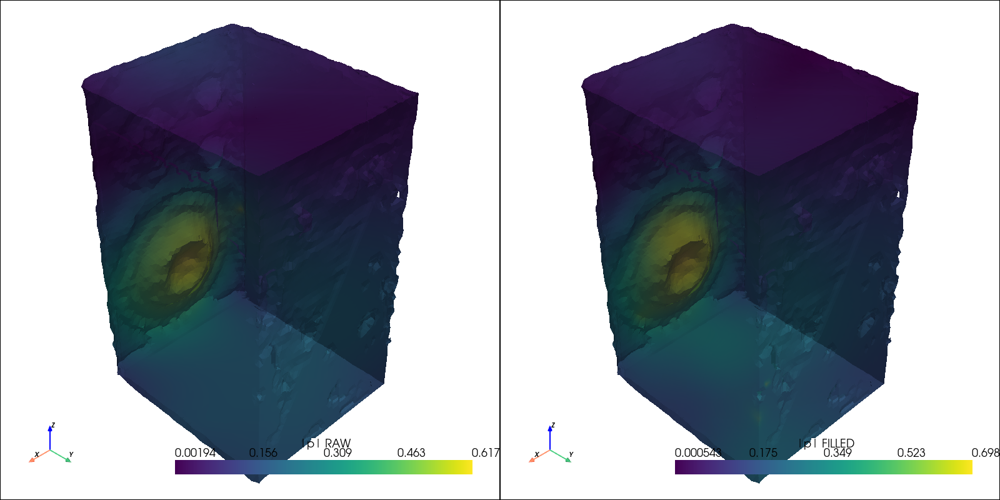

→ panel: figs/panel_speaker_1008Hz_pmag.png


{'panel': 'figs/panel_speaker_1008Hz_pmag.png'}

In [49]:
# --- Safe raw slice loader and fixed panel_speaker_raw_vs_filled ---
from pathlib import Path
import numpy as np, meshio, h5py
import pyvista as pv
pv.OFF_SCREEN = True

H5   = Path("exports/Loudspeaker_20mm.h5")
G    = "/Proc-2_3D_Cuboid,20_mm_resolution"
GEOM = Path("exports")/"loudspeaker_geometry.vtu"
c0, rho0 = 343.0, 1.204

def _load_raw_slice_kpu(f0):
    """Always return (k, Pk, Uk) regardless of any other _load_raw_slice in the notebook."""
    with h5py.File(H5,"r") as f:
        freq = np.array(f[f"{G}/FREQUENCY_VECTOR"]).ravel()
        k = int(np.argmin(np.abs(freq - f0)))
        Rp = np.array(f[f"{G}/REAL_TFpref1"])[k]
        Ip = np.array(f[f"{G}/IMAG_TFpref1"])[k]
        Ru = np.array(f[f"{G}/REAL_TFxyzref1"])[k]
        Iu = np.array(f[f"{G}/IMAG_TFxyzref1"])[k]
    return k, (Rp + 1j*Ip), (Ru + 1j*Iu)

def _solve_w_balanced(pos_src, p_meas, u_meas, f0, lam=3e-2, alpha=0.0):
    """Balanced LS using Z0 to make p and u rows comparable."""
    omega = 2*np.pi*f0
    k = (1-1j*alpha)*omega/c0
    Gp = G_mat(pos_src, pos_src, k)                        # (N,N)
    Gu = -(1/(1j*omega*rho0))*dG_mat(pos_src, pos_src, k)  # (N,N,3)
    Z0 = rho0*c0
    A = np.concatenate([Gp, Gu[:,:,0]*Z0, Gu[:,:,1]*Z0, Gu[:,:,2]*Z0], axis=0)
    b = np.concatenate([p_meas, u_meas[:,0]*Z0, u_meas[:,1]*Z0, u_meas[:,2]*Z0], axis=0)
    AH = A.conj().T
    w = np.linalg.solve(AH@A + lam*np.eye(A.shape[1], dtype=complex), AH@b)
    return w, k, omega

def _eval_on_mesh(V, pos_src, w, k, omega):
    GpV = G_mat(V, pos_src, k)
    dGV = dG_mat(V, pos_src, k)
    pV  = GpV @ w
    uV  = -(1/(1j*omega*rho0)) * np.tensordot(dGV, w, axes=(1,0))
    Iact = 0.5*np.real(pV*np.conj(uV).sum(axis=1))
    return pV, uV, Iact

def panel_speaker_raw_vs_filled(f0, lam=3e-2, alpha=0.0, tag="noiseaware", figs_dir="figs"):
    """Left=RAW, Right=FILLED panels of |p| on the loudspeaker mesh."""
    # geometry & positions
    geom = meshio.read(str(GEOM))
    V = geom.points
    global pos
    if 'pos' not in globals():
        with h5py.File(H5,"r") as f:
            pos = np.array(f[f"{G}/POSITION"])

    # raw slice
    _, P_raw, U_raw = _load_raw_slice_kpu(f0)

    # filled slice (from noise-aware NPZ)
    Z = np.load(Path("exports")/f"filled_arrays_{tag}_{int(round(f0))}Hz.npz", allow_pickle=True)
    P_fill = Z["p"]; U_fill = Z["u"]

    # equivalent sources & evaluation
    w_raw,  k, om = _solve_w_balanced(pos, P_raw,  U_raw,  f0, lam=lam, alpha=alpha)
    w_fill, _, _  = _solve_w_balanced(pos, P_fill, U_fill, f0, lam=lam, alpha=alpha)
    pV_raw,  _, _ = _eval_on_mesh(V, pos, w_raw,  k, om)
    pV_fill, _, _ = _eval_on_mesh(V, pos, w_fill, k, om)

    # side-by-side panel
    outdir = Path(figs_dir); outdir.mkdir(parents=True, exist_ok=True)
    gL = pv.read(str(GEOM)); gR = pv.read(str(GEOM))
    gL["|p| RAW"]    = np.abs(pV_raw).astype(float)
    gR["|p| FILLED"] = np.abs(pV_fill).astype(float)

    pl = pv.Plotter(off_screen=True, shape=(1,2), window_size=[1600,800])
    pl.subplot(0,0); pl.add_mesh(gL, scalars="|p| RAW",    show_edges=False, nan_opacity=0.15); pl.add_text(f"RAW |p| @ {f0:.1f} Hz", 12);    pl.add_axes(); pl.view_isometric()
    pl.subplot(0,1); pl.add_mesh(gR, scalars="|p| FILLED", show_edges=False, nan_opacity=0.15); pl.add_text(f"FILLED |p| @ {f0:.1f} Hz", 12); pl.add_axes(); pl.view_isometric()
    panel = outdir/f"panel_speaker_{int(round(f0))}Hz_pmag.png"
    pl.show(screenshot=str(panel))
    print("→ panel:", panel)
    return {"panel": str(panel)}

# Example
panel_speaker_raw_vs_filled(1007.8, lam=3e-2, alpha=0.0, tag="noiseaware")


MULTIPLE-FREQUENCIES

[Noise fill] f0=257.8 Hz | replaced: p=158, ux=158, uy=158, uz=158
→ wrote exports/filled_points_noiseaware_258Hz.vtu
→ wrote exports/filled_arrays_noiseaware_258Hz.npz
→ wrote 00_258Hz/noise_scores_258Hz.png


/Users/marcialsanchis/miniconda3/envs/surd/lib/python3.10/site-packages/pyvista/jupyter/notebook.py:56: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


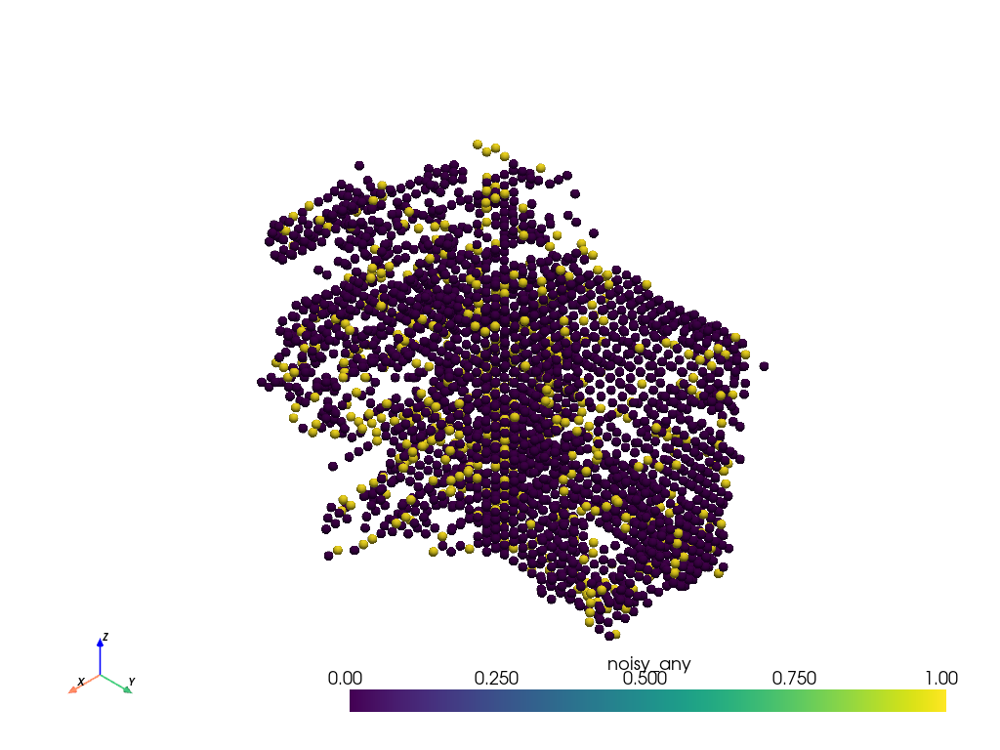

→ wrote 00_258Hz/noise_flags_258Hz.png
[Eval noiseaware] f0=257.8 Hz | replaced counts: {'p': 158, 'ux': 158, 'uy': 158, 'uz': 158}
         p_nrmsd_raw: 1.1794
      p_nrmsd_filled: 0.9998
        ux_nrmsd_raw: 2.8248
     ux_nrmsd_filled: 0.9988
        uy_nrmsd_raw: 1.4516
     uy_nrmsd_filled: 1.1525
        uz_nrmsd_raw: 3.2790
     uz_nrmsd_filled: 1.0991
  → 00_258Hz/hist_res_p_258Hz.png
  → 00_258Hz/hist_res_ux_258Hz.png
  → 00_258Hz/hist_res_uy_258Hz.png
  → 00_258Hz/hist_res_uz_258Hz.png
  → 00_258Hz/box_imp_mag_258Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:78: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_mag_raw, imp_mag_f], labels=["raw","filled"])
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:83: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_phi_raw, imp_phi_f], labels=["raw","filled"])


  → 00_258Hz/box_imp_phi_258Hz.png
  → 00_258Hz/scores_258Hz.png
[Holdout @ 257.8 Hz] NRMSD p/ux/uy/uz = 0.8415/3.3874/2.7029/3.8819 | train=2890 holdout=263
[Eval noiseaware] f0=257.8 Hz | replaced counts: {'p': 158, 'ux': 158, 'uy': 158, 'uz': 158}
         p_nrmsd_raw: 1.1794
      p_nrmsd_filled: 0.9998
        ux_nrmsd_raw: 2.8248
     ux_nrmsd_filled: 0.9988
        uy_nrmsd_raw: 1.4516
     uy_nrmsd_filled: 1.1525
        uz_nrmsd_raw: 3.2790
     uz_nrmsd_filled: 1.0991
  → 00_258Hz/hist_res_p_258Hz.png
  → 00_258Hz/hist_res_ux_258Hz.png
  → 00_258Hz/hist_res_uy_258Hz.png
  → 00_258Hz/hist_res_uz_258Hz.png
  → 00_258Hz/box_imp_mag_258Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:78: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_mag_raw, imp_mag_f], labels=["raw","filled"])
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:83: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_phi_raw, imp_phi_f], labels=["raw","filled"])


  → 00_258Hz/box_imp_phi_258Hz.png
  → 00_258Hz/scores_258Hz.png
→ panel: 00_258Hz/panel_258Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:74: PyVistaDeprecationWarning: 
../../../../../../var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:74: Argument 'position' must be passed as a keyword argument to function 'BasePlotter.add_text'.
From version 0.50, passing this as a positional argument will result in a TypeError.
  pl.subplot(0,0); pl.add_mesh(gL, scalars="|p| RAW",    show_edges=False, nan_opacity=0.15); pl.add_text(f"RAW |p| @ {f0:.1f} Hz", 12);    pl.add_axes(); pl.view_isometric()
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:75: PyVistaDeprecationWarning: 
../../../../../../var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:75: Argument 'position' must be passed as a keyword argument to function 'BasePlotter.add_text'.
From version 0.50, passing this as a positional argument will result in a TypeError.
  pl.subplot(0,1); pl.add_mesh(gR, scalars="|p| FIL

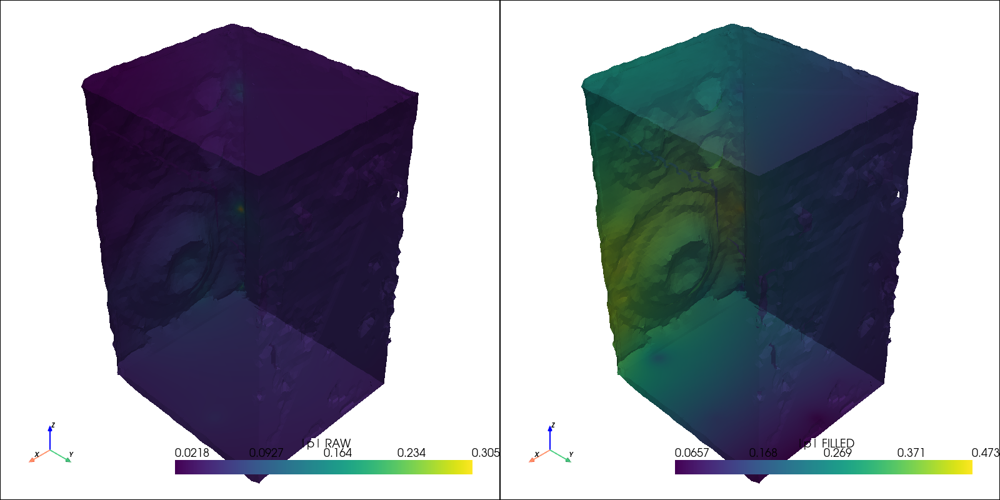

→ panel: 00_258Hz/panel_speaker_258Hz_pmag.png
[Noise fill] f0=492.2 Hz | replaced: p=158, ux=158, uy=158, uz=158
→ wrote exports/filled_points_noiseaware_492Hz.vtu
→ wrote exports/filled_arrays_noiseaware_492Hz.npz
→ wrote 01_492Hz/noise_scores_492Hz.png


/Users/marcialsanchis/miniconda3/envs/surd/lib/python3.10/site-packages/pyvista/jupyter/notebook.py:56: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


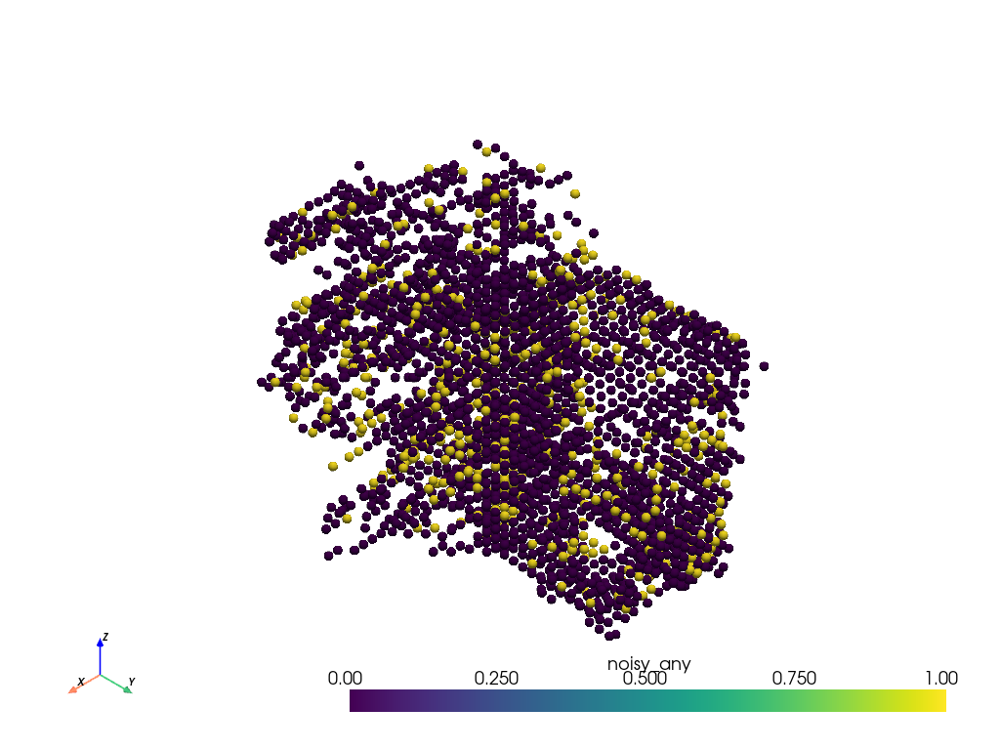

→ wrote 01_492Hz/noise_flags_492Hz.png
[Eval noiseaware] f0=492.2 Hz | replaced counts: {'p': 158, 'ux': 158, 'uy': 158, 'uz': 158}
         p_nrmsd_raw: 1.0214
      p_nrmsd_filled: 1.0005
        ux_nrmsd_raw: 2.3024
     ux_nrmsd_filled: 1.0276
        uy_nrmsd_raw: 1.6113
     uy_nrmsd_filled: 1.0546
        uz_nrmsd_raw: 2.8656
     uz_nrmsd_filled: 1.1449
  → 01_492Hz/hist_res_p_492Hz.png
  → 01_492Hz/hist_res_ux_492Hz.png
  → 01_492Hz/hist_res_uy_492Hz.png
  → 01_492Hz/hist_res_uz_492Hz.png
  → 01_492Hz/box_imp_mag_492Hz.png
  → 01_492Hz/box_imp_phi_492Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:78: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_mag_raw, imp_mag_f], labels=["raw","filled"])
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:83: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_phi_raw, imp_phi_f], labels=["raw","filled"])


  → 01_492Hz/scores_492Hz.png
[Holdout @ 492.2 Hz] NRMSD p/ux/uy/uz = 0.9385/3.7974/2.4983/4.7287 | train=2890 holdout=263
[Eval noiseaware] f0=492.2 Hz | replaced counts: {'p': 158, 'ux': 158, 'uy': 158, 'uz': 158}
         p_nrmsd_raw: 1.0214
      p_nrmsd_filled: 1.0005
        ux_nrmsd_raw: 2.3024
     ux_nrmsd_filled: 1.0276
        uy_nrmsd_raw: 1.6113
     uy_nrmsd_filled: 1.0546
        uz_nrmsd_raw: 2.8656
     uz_nrmsd_filled: 1.1449
  → 01_492Hz/hist_res_p_492Hz.png
  → 01_492Hz/hist_res_ux_492Hz.png
  → 01_492Hz/hist_res_uy_492Hz.png
  → 01_492Hz/hist_res_uz_492Hz.png
  → 01_492Hz/box_imp_mag_492Hz.png
  → 01_492Hz/box_imp_phi_492Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:78: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_mag_raw, imp_mag_f], labels=["raw","filled"])
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:83: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_phi_raw, imp_phi_f], labels=["raw","filled"])


  → 01_492Hz/scores_492Hz.png
→ panel: 01_492Hz/panel_492Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:74: PyVistaDeprecationWarning: 
../../../../../../var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:74: Argument 'position' must be passed as a keyword argument to function 'BasePlotter.add_text'.
From version 0.50, passing this as a positional argument will result in a TypeError.
  pl.subplot(0,0); pl.add_mesh(gL, scalars="|p| RAW",    show_edges=False, nan_opacity=0.15); pl.add_text(f"RAW |p| @ {f0:.1f} Hz", 12);    pl.add_axes(); pl.view_isometric()
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:75: PyVistaDeprecationWarning: 
../../../../../../var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:75: Argument 'position' must be passed as a keyword argument to function 'BasePlotter.add_text'.
From version 0.50, passing this as a positional argument will result in a TypeError.
  pl.subplot(0,1); pl.add_mesh(gR, scalars="|p| FIL

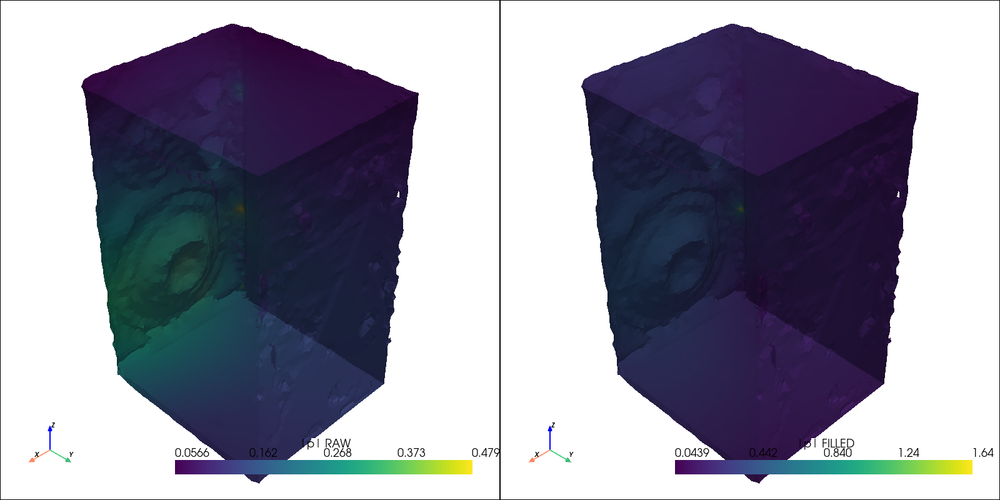

→ panel: 01_492Hz/panel_speaker_492Hz_pmag.png
[Noise fill] f0=750.0 Hz | replaced: p=158, ux=158, uy=158, uz=158
→ wrote exports/filled_points_noiseaware_750Hz.vtu
→ wrote exports/filled_arrays_noiseaware_750Hz.npz
→ wrote 02_750Hz/noise_scores_750Hz.png


/Users/marcialsanchis/miniconda3/envs/surd/lib/python3.10/site-packages/pyvista/jupyter/notebook.py:56: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


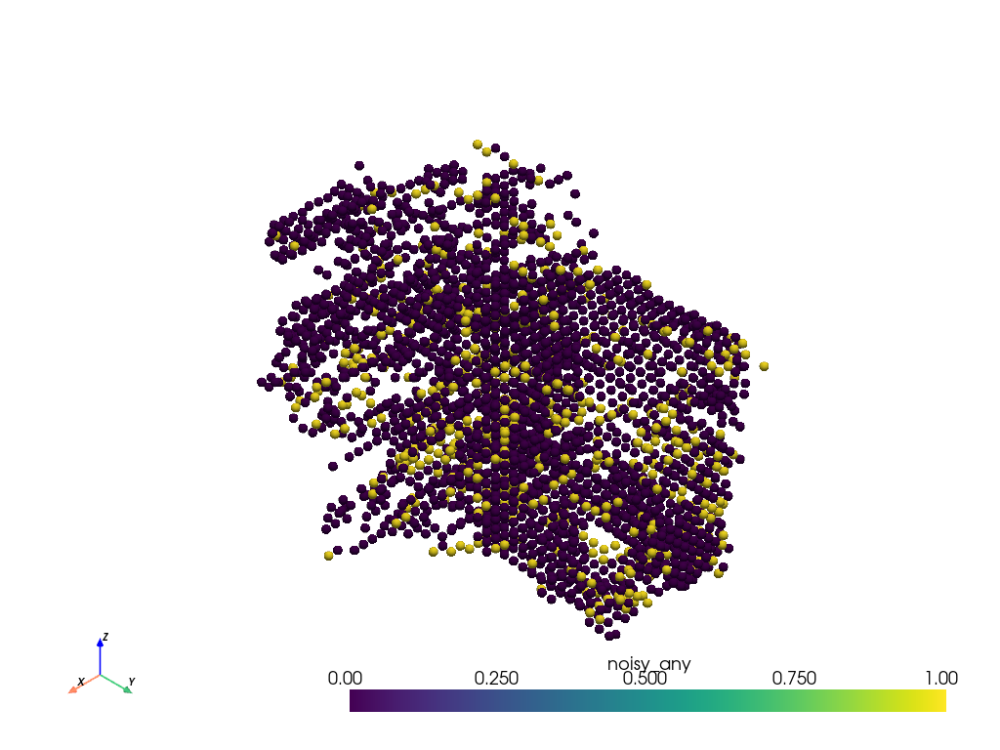

→ wrote 02_750Hz/noise_flags_750Hz.png
[Eval noiseaware] f0=750.0 Hz | replaced counts: {'p': 158, 'ux': 158, 'uy': 158, 'uz': 158}
         p_nrmsd_raw: 1.1216
      p_nrmsd_filled: 1.0006
        ux_nrmsd_raw: 1.9989
     ux_nrmsd_filled: 1.0382
        uy_nrmsd_raw: 1.4390
     uy_nrmsd_filled: 1.0753
        uz_nrmsd_raw: 3.0377
     uz_nrmsd_filled: 1.1617
  → 02_750Hz/hist_res_p_750Hz.png
  → 02_750Hz/hist_res_ux_750Hz.png
  → 02_750Hz/hist_res_uy_750Hz.png
  → 02_750Hz/hist_res_uz_750Hz.png
  → 02_750Hz/box_imp_mag_750Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:78: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_mag_raw, imp_mag_f], labels=["raw","filled"])
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:83: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_phi_raw, imp_phi_f], labels=["raw","filled"])


  → 02_750Hz/box_imp_phi_750Hz.png
  → 02_750Hz/scores_750Hz.png
[Holdout @ 750.0 Hz] NRMSD p/ux/uy/uz = 0.9417/3.8352/2.4877/4.8895 | train=2892 holdout=261
[Eval noiseaware] f0=750.0 Hz | replaced counts: {'p': 158, 'ux': 158, 'uy': 158, 'uz': 158}
         p_nrmsd_raw: 1.1216
      p_nrmsd_filled: 1.0006
        ux_nrmsd_raw: 1.9989
     ux_nrmsd_filled: 1.0382
        uy_nrmsd_raw: 1.4390
     uy_nrmsd_filled: 1.0753
        uz_nrmsd_raw: 3.0377
     uz_nrmsd_filled: 1.1617
  → 02_750Hz/hist_res_p_750Hz.png
  → 02_750Hz/hist_res_ux_750Hz.png
  → 02_750Hz/hist_res_uy_750Hz.png
  → 02_750Hz/hist_res_uz_750Hz.png
  → 02_750Hz/box_imp_mag_750Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:78: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_mag_raw, imp_mag_f], labels=["raw","filled"])
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:83: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_phi_raw, imp_phi_f], labels=["raw","filled"])


  → 02_750Hz/box_imp_phi_750Hz.png
  → 02_750Hz/scores_750Hz.png
→ panel: 02_750Hz/panel_750Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:74: PyVistaDeprecationWarning: 
../../../../../../var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:74: Argument 'position' must be passed as a keyword argument to function 'BasePlotter.add_text'.
From version 0.50, passing this as a positional argument will result in a TypeError.
  pl.subplot(0,0); pl.add_mesh(gL, scalars="|p| RAW",    show_edges=False, nan_opacity=0.15); pl.add_text(f"RAW |p| @ {f0:.1f} Hz", 12);    pl.add_axes(); pl.view_isometric()
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:75: PyVistaDeprecationWarning: 
../../../../../../var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:75: Argument 'position' must be passed as a keyword argument to function 'BasePlotter.add_text'.
From version 0.50, passing this as a positional argument will result in a TypeError.
  pl.subplot(0,1); pl.add_mesh(gR, scalars="|p| FIL

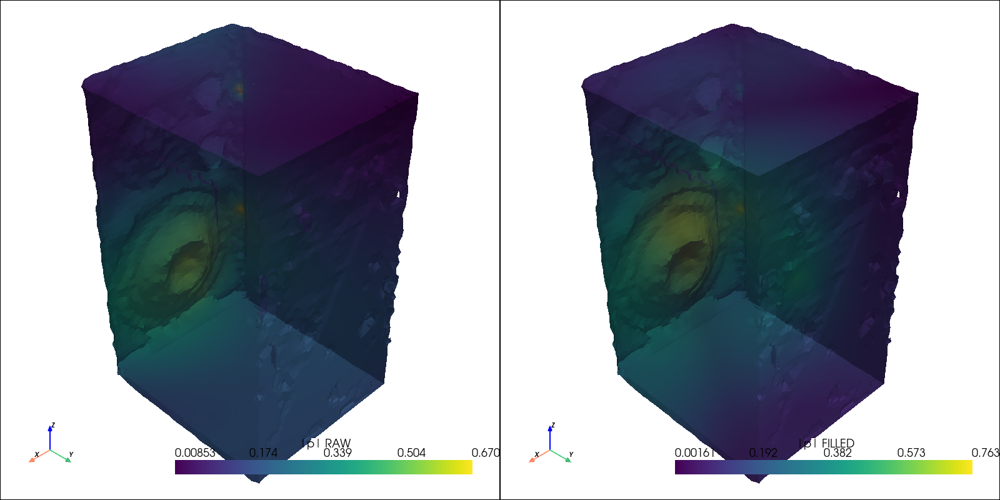

→ panel: 02_750Hz/panel_speaker_750Hz_pmag.png
[Noise fill] f0=1007.8 Hz | replaced: p=158, ux=158, uy=158, uz=158
→ wrote exports/filled_points_noiseaware_1008Hz.vtu
→ wrote exports/filled_arrays_noiseaware_1008Hz.npz
→ wrote 03_1008Hz/noise_scores_1008Hz.png


/Users/marcialsanchis/miniconda3/envs/surd/lib/python3.10/site-packages/pyvista/jupyter/notebook.py:56: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


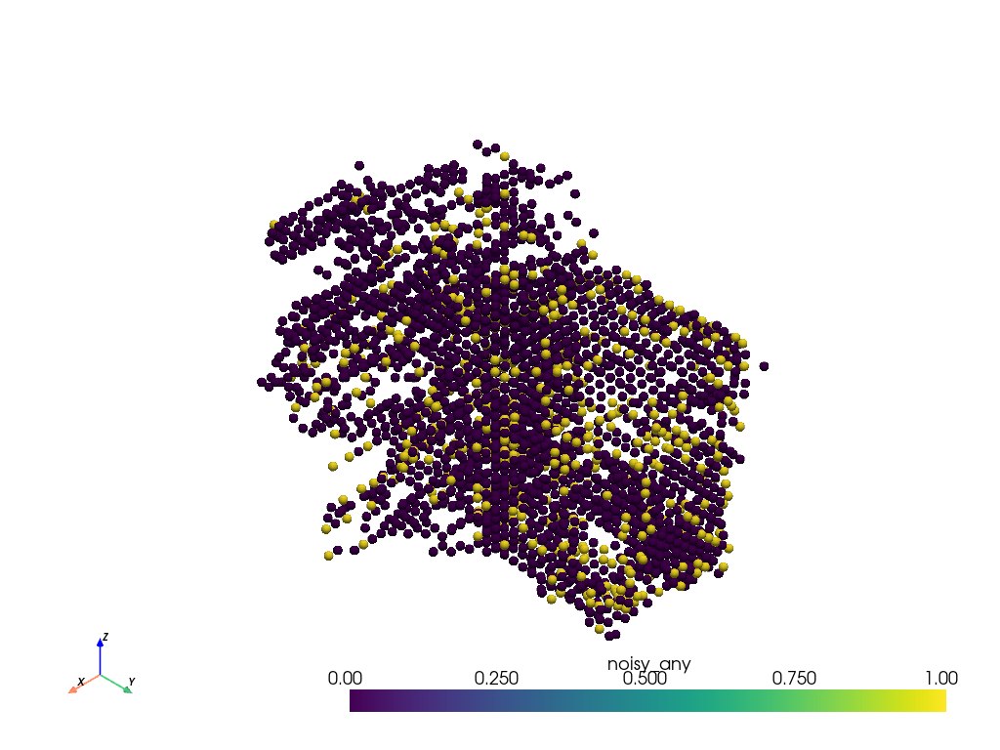

→ wrote 03_1008Hz/noise_flags_1008Hz.png
[Eval noiseaware] f0=1007.8 Hz | replaced counts: {'p': 158, 'ux': 158, 'uy': 158, 'uz': 158}
         p_nrmsd_raw: 1.1634
      p_nrmsd_filled: 1.0013
        ux_nrmsd_raw: 2.4709
     ux_nrmsd_filled: 1.0867
        uy_nrmsd_raw: 1.2123
     uy_nrmsd_filled: 1.1396
        uz_nrmsd_raw: 2.4982
     uz_nrmsd_filled: 1.1942
  → 03_1008Hz/hist_res_p_1008Hz.png
  → 03_1008Hz/hist_res_ux_1008Hz.png
  → 03_1008Hz/hist_res_uy_1008Hz.png
  → 03_1008Hz/hist_res_uz_1008Hz.png
  → 03_1008Hz/box_imp_mag_1008Hz.png
  → 03_1008Hz/box_imp_phi_1008Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:78: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_mag_raw, imp_mag_f], labels=["raw","filled"])
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:83: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_phi_raw, imp_phi_f], labels=["raw","filled"])


  → 03_1008Hz/scores_1008Hz.png
[Holdout @ 1007.8 Hz] NRMSD p/ux/uy/uz = 0.9794/3.1854/1.8654/3.6371 | train=2892 holdout=261
[Eval noiseaware] f0=1007.8 Hz | replaced counts: {'p': 158, 'ux': 158, 'uy': 158, 'uz': 158}
         p_nrmsd_raw: 1.1634
      p_nrmsd_filled: 1.0013
        ux_nrmsd_raw: 2.4709
     ux_nrmsd_filled: 1.0867
        uy_nrmsd_raw: 1.2123
     uy_nrmsd_filled: 1.1396
        uz_nrmsd_raw: 2.4982
     uz_nrmsd_filled: 1.1942
  → 03_1008Hz/hist_res_p_1008Hz.png
  → 03_1008Hz/hist_res_ux_1008Hz.png
  → 03_1008Hz/hist_res_uy_1008Hz.png
  → 03_1008Hz/hist_res_uz_1008Hz.png
  → 03_1008Hz/box_imp_mag_1008Hz.png
  → 03_1008Hz/box_imp_phi_1008Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:78: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_mag_raw, imp_mag_f], labels=["raw","filled"])
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:83: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_phi_raw, imp_phi_f], labels=["raw","filled"])


  → 03_1008Hz/scores_1008Hz.png
→ panel: 03_1008Hz/panel_1008Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:74: PyVistaDeprecationWarning: 
../../../../../../var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:74: Argument 'position' must be passed as a keyword argument to function 'BasePlotter.add_text'.
From version 0.50, passing this as a positional argument will result in a TypeError.
  pl.subplot(0,0); pl.add_mesh(gL, scalars="|p| RAW",    show_edges=False, nan_opacity=0.15); pl.add_text(f"RAW |p| @ {f0:.1f} Hz", 12);    pl.add_axes(); pl.view_isometric()
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:75: PyVistaDeprecationWarning: 
../../../../../../var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:75: Argument 'position' must be passed as a keyword argument to function 'BasePlotter.add_text'.
From version 0.50, passing this as a positional argument will result in a TypeError.
  pl.subplot(0,1); pl.add_mesh(gR, scalars="|p| FIL

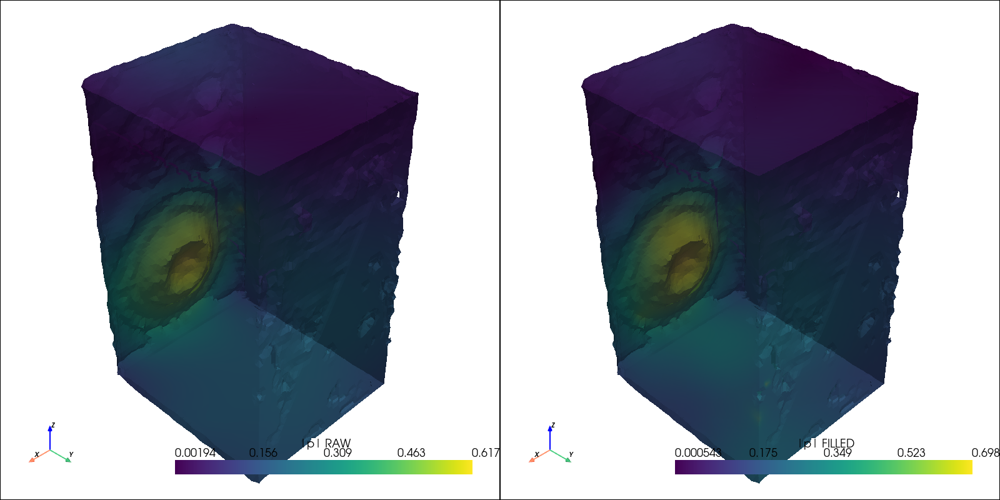

→ panel: 03_1008Hz/panel_speaker_1008Hz_pmag.png
[Noise fill] f0=1242.2 Hz | replaced: p=158, ux=158, uy=158, uz=158
→ wrote exports/filled_points_noiseaware_1242Hz.vtu
→ wrote exports/filled_arrays_noiseaware_1242Hz.npz
→ wrote 04_1242Hz/noise_scores_1242Hz.png


/Users/marcialsanchis/miniconda3/envs/surd/lib/python3.10/site-packages/pyvista/jupyter/notebook.py:56: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


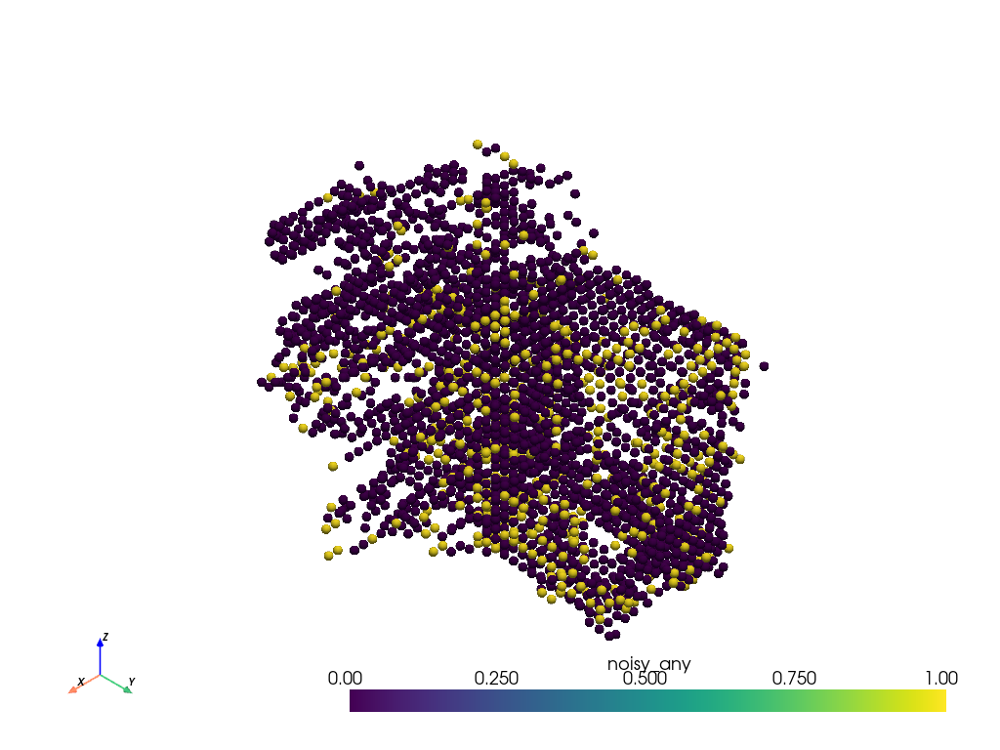

→ wrote 04_1242Hz/noise_flags_1242Hz.png
[Eval noiseaware] f0=1242.2 Hz | replaced counts: {'p': 158, 'ux': 158, 'uy': 158, 'uz': 158}
         p_nrmsd_raw: 1.5314
      p_nrmsd_filled: 1.0001
        ux_nrmsd_raw: 2.6173
     ux_nrmsd_filled: 1.1419
        uy_nrmsd_raw: 1.7490
     uy_nrmsd_filled: 1.2298
        uz_nrmsd_raw: 2.2038
     uz_nrmsd_filled: 1.2845
  → 04_1242Hz/hist_res_p_1242Hz.png
  → 04_1242Hz/hist_res_ux_1242Hz.png
  → 04_1242Hz/hist_res_uy_1242Hz.png
  → 04_1242Hz/hist_res_uz_1242Hz.png
  → 04_1242Hz/box_imp_mag_1242Hz.png
  → 04_1242Hz/box_imp_phi_1242Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:78: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_mag_raw, imp_mag_f], labels=["raw","filled"])
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:83: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_phi_raw, imp_phi_f], labels=["raw","filled"])


  → 04_1242Hz/scores_1242Hz.png
[Holdout @ 1242.2 Hz] NRMSD p/ux/uy/uz = 0.9949/3.5686/1.9893/3.1260 | train=2891 holdout=262
[Eval noiseaware] f0=1242.2 Hz | replaced counts: {'p': 158, 'ux': 158, 'uy': 158, 'uz': 158}
         p_nrmsd_raw: 1.5314
      p_nrmsd_filled: 1.0001
        ux_nrmsd_raw: 2.6173
     ux_nrmsd_filled: 1.1419
        uy_nrmsd_raw: 1.7490
     uy_nrmsd_filled: 1.2298
        uz_nrmsd_raw: 2.2038
     uz_nrmsd_filled: 1.2845
  → 04_1242Hz/hist_res_p_1242Hz.png
  → 04_1242Hz/hist_res_ux_1242Hz.png
  → 04_1242Hz/hist_res_uy_1242Hz.png
  → 04_1242Hz/hist_res_uz_1242Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:78: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_mag_raw, imp_mag_f], labels=["raw","filled"])
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:83: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_phi_raw, imp_phi_f], labels=["raw","filled"])


  → 04_1242Hz/box_imp_mag_1242Hz.png
  → 04_1242Hz/box_imp_phi_1242Hz.png
  → 04_1242Hz/scores_1242Hz.png
→ panel: 04_1242Hz/panel_1242Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:74: PyVistaDeprecationWarning: 
../../../../../../var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:74: Argument 'position' must be passed as a keyword argument to function 'BasePlotter.add_text'.
From version 0.50, passing this as a positional argument will result in a TypeError.
  pl.subplot(0,0); pl.add_mesh(gL, scalars="|p| RAW",    show_edges=False, nan_opacity=0.15); pl.add_text(f"RAW |p| @ {f0:.1f} Hz", 12);    pl.add_axes(); pl.view_isometric()
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:75: PyVistaDeprecationWarning: 
../../../../../../var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:75: Argument 'position' must be passed as a keyword argument to function 'BasePlotter.add_text'.
From version 0.50, passing this as a positional argument will result in a TypeError.
  pl.subplot(0,1); pl.add_mesh(gR, scalars="|p| FIL

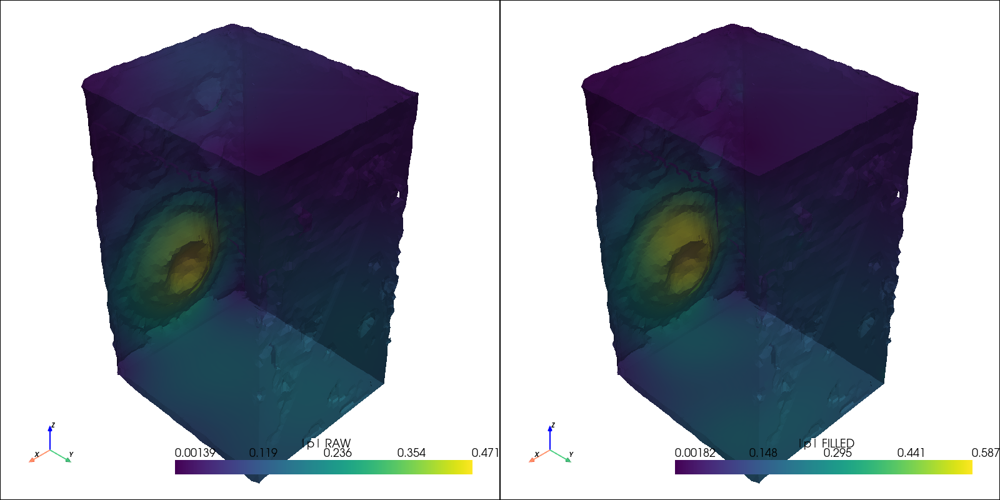

→ panel: 04_1242Hz/panel_speaker_1242Hz_pmag.png
[Noise fill] f0=1500.0 Hz | replaced: p=158, ux=158, uy=158, uz=158
→ wrote exports/filled_points_noiseaware_1500Hz.vtu
→ wrote exports/filled_arrays_noiseaware_1500Hz.npz
→ wrote 05_1500Hz/noise_scores_1500Hz.png


/Users/marcialsanchis/miniconda3/envs/surd/lib/python3.10/site-packages/pyvista/jupyter/notebook.py:56: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


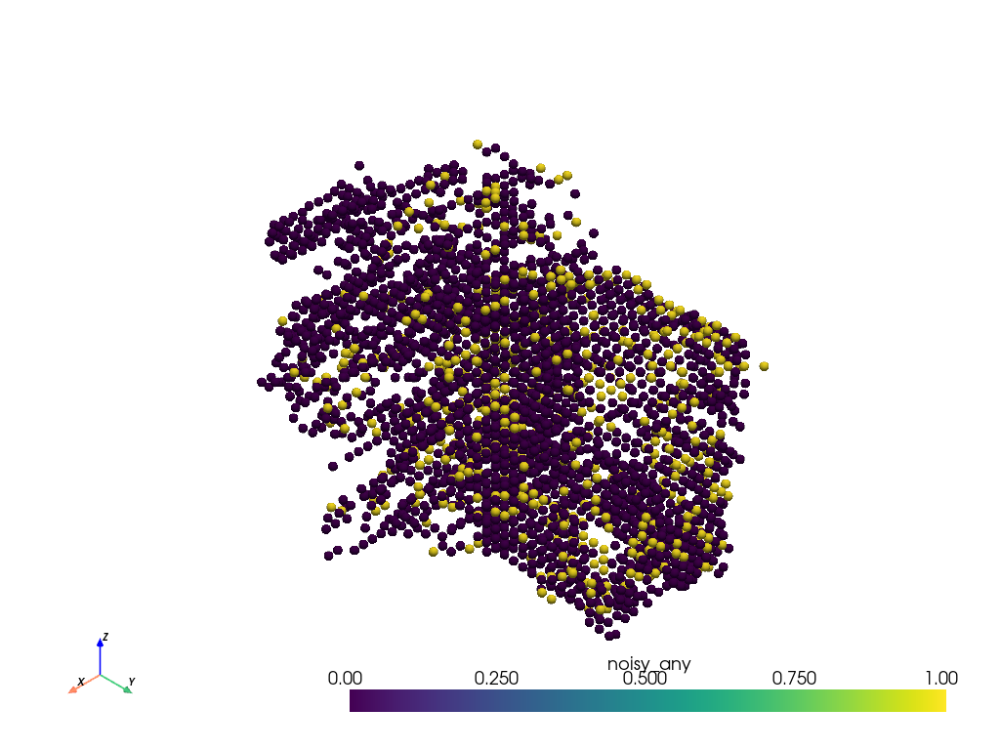

→ wrote 05_1500Hz/noise_flags_1500Hz.png
[Eval noiseaware] f0=1500.0 Hz | replaced counts: {'p': 158, 'ux': 158, 'uy': 158, 'uz': 158}
         p_nrmsd_raw: 1.9179
      p_nrmsd_filled: 1.0001
        ux_nrmsd_raw: 2.5351
     ux_nrmsd_filled: 1.1179
        uy_nrmsd_raw: 1.6676
     uy_nrmsd_filled: 1.6671
        uz_nrmsd_raw: 3.1520
     uz_nrmsd_filled: 1.1860
  → 05_1500Hz/hist_res_p_1500Hz.png
  → 05_1500Hz/hist_res_ux_1500Hz.png
  → 05_1500Hz/hist_res_uy_1500Hz.png
  → 05_1500Hz/hist_res_uz_1500Hz.png
  → 05_1500Hz/box_imp_mag_1500Hz.png
  → 05_1500Hz/box_imp_phi_1500Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:78: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_mag_raw, imp_mag_f], labels=["raw","filled"])
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:83: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_phi_raw, imp_phi_f], labels=["raw","filled"])


  → 05_1500Hz/scores_1500Hz.png
[Holdout @ 1500.0 Hz] NRMSD p/ux/uy/uz = 1.0138/2.5350/1.6320/2.9027 | train=2892 holdout=261
[Eval noiseaware] f0=1500.0 Hz | replaced counts: {'p': 158, 'ux': 158, 'uy': 158, 'uz': 158}
         p_nrmsd_raw: 1.9179
      p_nrmsd_filled: 1.0001
        ux_nrmsd_raw: 2.5351
     ux_nrmsd_filled: 1.1179
        uy_nrmsd_raw: 1.6676
     uy_nrmsd_filled: 1.6671
        uz_nrmsd_raw: 3.1520
     uz_nrmsd_filled: 1.1860
  → 05_1500Hz/hist_res_p_1500Hz.png
  → 05_1500Hz/hist_res_ux_1500Hz.png
  → 05_1500Hz/hist_res_uy_1500Hz.png
  → 05_1500Hz/hist_res_uz_1500Hz.png
  → 05_1500Hz/box_imp_mag_1500Hz.png
  → 05_1500Hz/box_imp_phi_1500Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:78: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_mag_raw, imp_mag_f], labels=["raw","filled"])
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/4273706815.py:83: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([imp_phi_raw, imp_phi_f], labels=["raw","filled"])


  → 05_1500Hz/scores_1500Hz.png
→ panel: 05_1500Hz/panel_1500Hz.png


/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:74: PyVistaDeprecationWarning: 
../../../../../../var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:74: Argument 'position' must be passed as a keyword argument to function 'BasePlotter.add_text'.
From version 0.50, passing this as a positional argument will result in a TypeError.
  pl.subplot(0,0); pl.add_mesh(gL, scalars="|p| RAW",    show_edges=False, nan_opacity=0.15); pl.add_text(f"RAW |p| @ {f0:.1f} Hz", 12);    pl.add_axes(); pl.view_isometric()
/var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:75: PyVistaDeprecationWarning: 
../../../../../../var/folders/5n/pc83w9sx6rv0_bxqr04fgszw0000gn/T/ipykernel_16678/311062199.py:75: Argument 'position' must be passed as a keyword argument to function 'BasePlotter.add_text'.
From version 0.50, passing this as a positional argument will result in a TypeError.
  pl.subplot(0,1); pl.add_mesh(gR, scalars="|p| FIL

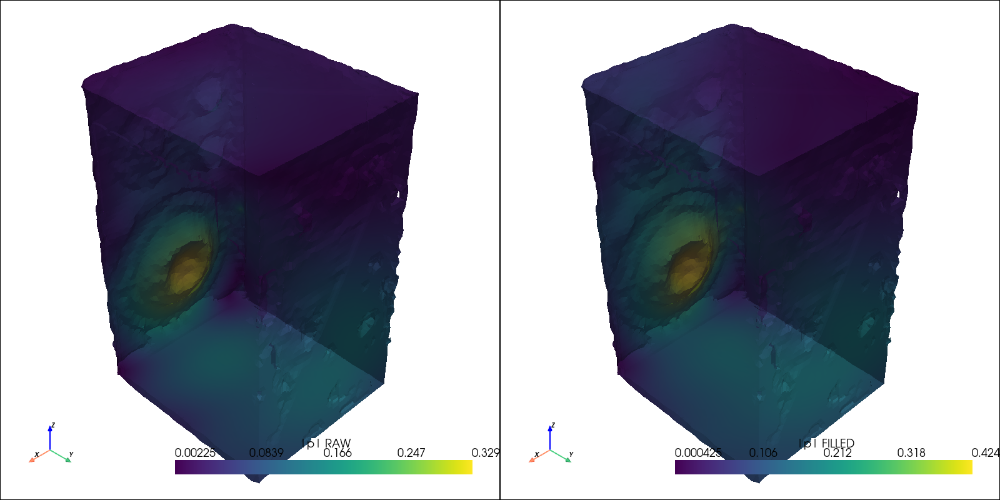

→ panel: 05_1500Hz/panel_speaker_1500Hz_pmag.png
Panels saved:
  00_258Hz/panel_speaker_258Hz_pmag.png
  01_492Hz/panel_speaker_492Hz_pmag.png
  02_750Hz/panel_speaker_750Hz_pmag.png
  03_1008Hz/panel_speaker_1008Hz_pmag.png
  04_1242Hz/panel_speaker_1242Hz_pmag.png
  05_1500Hz/panel_speaker_1500Hz_pmag.png


In [51]:
# === Cell A: batch across frequencies (fill + metrics + speaker panels) ===
from pathlib import Path
import numpy as np

F_LIST = [257.8, 492.2, 750.0, 1007.8, 1242.2, 1500.0]

panels = []
for i, f in enumerate(F_LIST):
    outdir = f"{i:02d}_{int(round(f))}Hz"
    # 1) fill (noise-aware). If your fill function accepts figs_dir, pass it; if not, it still writes NPZ/VTU in exports/
    _ = fill_noisy_at_frequency(f,outdir, lam=3e-2, alpha=0.0, top_pct=0.05)

    # 2) Evaluate improvement and save plots to this folder
    _ = evaluate_noise_fill(f, nbr_idx_, tag="noiseaware", figs_dir=outdir)

    # 3) Optional: objective holdout accuracy
    _ = holdout_error(f, nbr_idx_, tag="noiseaware", frac=0.1, seed=42)

    # 4) Slide-ready panel + slide montage
    slide_panel(f, tag="noiseaware", figs_dir=outdir)
    out = panel_speaker_raw_vs_filled(f, lam=3e-2, alpha=0.0, tag="noiseaware", figs_dir=outdir)
    panels.append(out["panel"])

print("Panels saved:")
for p in panels:
    print(" ", p)


In [52]:
# === Cell B: montage + gif ===
from pathlib import Path
import imageio.v3 as iio
import numpy as np
import matplotlib.pyplot as plt

FIGS = Path("speaker")
# Reuse the panels just created (or glob)
panel_paths = sorted(FIGS.glob("panel_speaker_*Hz_pmag.png"))

# 1) Simple 2xN montage (matplotlib)
cols = 2; rows = int(np.ceil(len(panel_paths)/cols))
fig, axes = plt.subplots(rows, cols, figsize=(12, 4*rows))
axes = np.atleast_2d(axes)
for ax, path in zip(axes.ravel(), panel_paths):
    img = iio.imread(path)
    ax.imshow(img); ax.set_title(path.name); ax.axis('off')
# blank unused axes
for ax in axes.ravel()[len(panel_paths):]:
    ax.axis('off')
mont = FIGS / "montage_panels_pmag.png"
plt.tight_layout(); plt.savefig(mont, dpi=180); plt.close(fig)
print("→ montage:", mont)

# 2) Animated GIF over frequency
gif = FIGS / "speaker_raw_vs_filled_pmag.gif"
frames = [iio.imread(p) for p in panel_paths]
iio.imwrite(gif, frames, duration=1000)  # ms per frame
print("→ gif:", gif)


→ montage: speaker/montage_panels_pmag.png
→ gif: speaker/speaker_raw_vs_filled_pmag.gif
